In [ ]:
import os
import random
import numpy as np
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import gc 
import time
import copy
import math
from torchvision.transforms import RandAugment

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchinfo
from torchinfo import summary
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import WeightedRandomSampler
from torchvision import transforms
from torchvision import models
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, accuracy_score, f1_score, cohen_kappa_score, roc_auc_score, precision_score, recall_score
from PIL import Image


import hashlib
import shutil
import ssl
import tempfile
import warnings
from pathlib import Path
from urllib.error import URLError
from urllib.parse import urlparse
from urllib.request import HTTPSHandler, Request, build_opener

import torch
import torch.nn as nn
from torch.hub import get_dir as get_torch_hub_dir
from torchvision import models
from torchvision.models import VGG16_Weights, vgg16

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [2]:

base_path = 'LungHist700_combined/data/'
csv_path = base_path + 'data.csv'
images_base = base_path + 'images/' 

batch_size = 32
num_epochs = 100
learning_rate = 3e-4
random_seed = 42

def seed_everything(seed):
    random.seed(seed)

    os.environ['PYTHONHASHSEED'] = str(seed)

    np.random.seed(seed)

    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    torch.use_deterministic_algorithms(True)


def seed_worker(worker_id):

    worker_seed = torch.initial_seed() % 2**32

    np.random.seed(worker_seed)
    random.seed(worker_seed)

seed_everything(random_seed)

g = torch.Generator()
g.manual_seed(random_seed)


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo em uso: {device}\n")

full_df = pd.read_csv(csv_path)
superclass_map = {'aca': 0, 'ssc': 1, 'scc': 1, 'nor': 2}
full_df['label'] = full_df['superclass'].map(superclass_map)

print("Dados carregados e mapeados com sucesso!")
print("Total de linhas:", len(full_df))
print("Colunas:", full_df.columns.tolist())
print("Exemplo das 5 primeiras linhas:\n", full_df.head())
print("Distribuição de resolução:\n", full_df['resolution'].value_counts())


def get_dataframe_no_loss(df_input):
    return df_input.sample(frac=1, random_state=random_seed).reset_index(drop=True)

print("Função de processamento de dados atualizada!")

Dispositivo em uso: cpu

Dados carregados e mapeados com sucesso!
Total de linhas: 691
Colunas: ['superclass', 'subclass', 'resolution', 'image_id', 'patient_id', 'label']
Exemplo das 5 primeiras linhas:
   superclass subclass resolution  image_id  patient_id  label
0        aca       bd        40x       901           1      0
1        aca       bd        40x       902           1      0
2        aca       bd        40x       903           1      0
3        aca       bd        40x       904           1      0
4        aca       bd        40x       905           1      0
Distribuição de resolução:
 resolution
20x    359
40x    332
Name: count, dtype: int64
Função de processamento de dados atualizada!


In [3]:
class LungHistDataset(Dataset):

    def __init__(self, dataframe, root_dir, transform=None):

        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):

        return len(self.df)

    def __getitem__(self, idx):

        row = self.df.iloc[idx]

        superclass = row['superclass']
        image_id = row['image_id']
        resolution = row['resolution']

        subclass = (
            row['subclass']
            if not pd.isna(row['subclass'])
            else ""
        )

        file_prefix = superclass

        if superclass == 'scc':

            folder_name = 'ssc'
            file_prefix = 'ssc'

        else:

            folder_name = superclass

        class_dir = os.path.join(
            self.root_dir,
            folder_name
        )

        potential_filenames = [

            f"{image_id}.jpg",

            f"{file_prefix}_{subclass}_{resolution}_{image_id}.jpg",

            f"{file_prefix}_{resolution}_{image_id}.jpg",

            f"{image_id}.png",

            f"{file_prefix}_{subclass}_{resolution}_{image_id}.png",

            f"{file_prefix}_{resolution}_{image_id}.png"
        ]

        img_path = None

        for fname in potential_filenames:

            full_path = os.path.join(
                class_dir,
                fname
            )

            if os.path.exists(full_path):

                img_path = full_path
                break

        if img_path is None and os.path.exists(class_dir):

            import glob

            search_pattern = os.path.join(
                class_dir,
                f"*{image_id}.*"
            )

            found_files = glob.glob(search_pattern)

            if found_files:

                img_path = found_files[0]

        try:

            if img_path is None:

                raise FileNotFoundError(
                    "Imagem não encontrada"
                )

            image = Image.open(img_path).convert("RGB")

        except Exception as e:

            print("\n" + "=" * 60)
            print("ERRO AO CARREGAR IMAGEM")
            print("=" * 60)

            print(f"ID: {image_id}")
            print(f"Classe: {superclass}")
            print(f"Resolution: {resolution}")
            print(f"Pasta: {class_dir}")
            print(f"Path encontrado: {img_path}")
            print(f"Erro: {e}")

            image = Image.new('RGB', (224, 224))

        label = row['label']

        if self.transform:

            image = self.transform(image)

        return image, label


print("✓ Classe Dataset definida com sucesso!")

✓ Classe Dataset definida com sucesso!


In [4]:
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandAugment(num_ops=2, magnitude=5),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ToTensor(),

   
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


val_test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

print("RandAugment configurado com sucesso.")

RandAugment configurado com sucesso.


/tmp/ipykernel_17351/1008371475.py:56: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 6, i + 2)


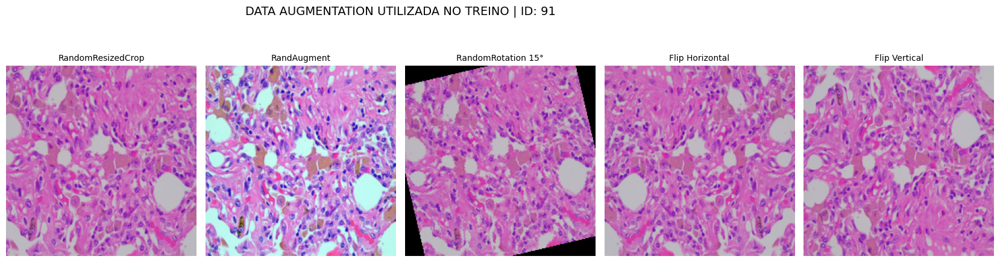

In [5]:
rand_idx = random.randint(0, len(full_df) - 1)

demo_ds = LungHistDataset(
    full_df,
    root_dir=images_base,
    transform=None
)

original_img, label_idx = demo_ds[rand_idx]

idx_to_class = {
    0: 'ACA',
    1: 'SCC',
    2: 'NOR'
}

class_name = idx_to_class[label_idx]

demo_augmentations = [
    ("RandomResizedCrop", transforms.RandomResizedCrop(
        224,
        scale=(0.8, 1.0)
    )),

    ("RandAugment", transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandAugment(num_ops=2, magnitude=5)
    ])),

    ("RandomRotation 15°", transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomRotation(15)
    ])),

    ("Flip Horizontal", transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(p=1.0)
    ])),

    ("Flip Vertical", transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomVerticalFlip(p=1.0)
    ])),
]

plt.figure(figsize=(20, 5))

plt.subplot(1, 5, 1)
plt.imshow(original_img)
plt.title(f"ORIGINAL ({class_name})", fontweight='bold')
plt.axis('off')

for i, (name, transform_func) in enumerate(demo_augmentations):
    aug_img = transform_func(original_img)

    plt.subplot(1, 6, i + 2)
    plt.imshow(aug_img)
    plt.title(name, fontsize=10)
    plt.axis('off')

img_id = full_df.iloc[rand_idx]['image_id']

plt.suptitle(
    f"DATA AUGMENTATION UTILIZADA NO TREINO | ID: {img_id}",
    fontsize=14
)

plt.tight_layout()
plt.show()

In [ ]:
def print_stats_table(df_name, train_df, val_df, test_df):
    c_train = train_df['label'].value_counts().to_dict()
    c_val   = val_df['label'].value_counts().to_dict()
    c_test  = test_df['label'].value_counts().to_dict()
    idx_to_class = {0: 'ACA', 1: 'SCC', 2: 'NOR'}
    
    print(f"\nCONJUNTO DE DADOS: {df_name}")
    print("-" * 42)
    print(f"{'CLASSE':<8} | {'TREINO':<8} | {'VALIDAÇÃO':<8} | {'TESTE':<8}")
    print("-" * 42)
    for idx in range(3): 
        name = idx_to_class[idx]
        print(f"{name:<8} | {c_train.get(idx, 0):<8} | {c_val.get(idx, 0):<8} | {c_test.get(idx, 0):<8}")
    print("-" * 42 + "\n")

print("Função print_stats_table definida com sucesso!")

Função print_stats_table definida com sucesso!


In [ ]:
def make_weighted_sampler(df_train, label_col='label', seed=42):

    class_counts = df_train[label_col].value_counts().sort_index().values

    # pesos inversos
    class_weights = 1.0 / class_counts

    sample_weights = [
        class_weights[label]
        for label in df_train[label_col]
    ]

    # generator fixo
    g = torch.Generator()
    g.manual_seed(seed)

    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(sample_weights),
        replacement=True,
        generator=g
    )

    return sampler

print("Função make_weighted_sampler definida com sucesso!")

Função make_weighted_sampler definida com sucesso!


In [8]:

def get_reproducible_ids(df, resolution):

    if resolution == '20x':
        train_ids = [2,3,4,5,7,8,12,14,15,16,17,18,20,21,23,24,25,26,28,29,30,33,36,37,38,39,41,42,45]
        val_ids   = [1,6,27,32,44]
        test_ids  = [9,13,31,40]

    elif resolution == '40x':
        train_ids = [2,6,8,9,10,12,13,14,16,18,19,21,22,24,28,29,31,33,34,35,36,38,40,44]
        val_ids   = [1,4,17,26,30,37,45]
        test_ids  = [11,15,20,25,32,43]

    else:
        raise ValueError("Resolution deve ser '20x' ou '40x'")

    train_df = df[df['patient_id'].isin(train_ids)]
    val_df   = df[df['patient_id'].isin(val_ids)]
    test_df  = df[df['patient_id'].isin(test_ids)]

    return train_df, val_df, test_df



def process_resolution(res):

    print(f"\n====================== {res.upper()} ======================")

   
    df_res = full_df[
        (full_df['resolution'] == res) &
        (full_df['superclass'].isin(['aca', 'nor', 'scc']))
    ].reset_index(drop=True)

    print(f"Dataset {res}: {len(df_res)} imagens")

  
    df_res = get_dataframe_no_loss(df_res)

    
    train_df, val_df, test_df = get_reproducible_ids(df_res, res)

    
    train_df = train_df.reset_index(drop=True)
    val_df   = val_df.reset_index(drop=True)
    test_df  = test_df.reset_index(drop=True)

  
    print("\n Classes por split:")
    for name, df_split in [("train", train_df), ("val", val_df), ("test", test_df)]:
        print(f"\n{name.upper()}")
        print(df_split["superclass"].value_counts())

    print("\n🔎 Verificação de leakage:")
    print("train ∩ val :", set(train_df['patient_id']) & set(val_df['patient_id']))
    print("train ∩ test:", set(train_df['patient_id']) & set(test_df['patient_id']))
    print("val ∩ test :", set(val_df['patient_id']) & set(test_df['patient_id']))

    train_sampler = make_weighted_sampler(train_df, label_col='label')

    train_ds = LungHistDataset(train_df, images_base, transform=train_transform)
    val_ds   = LungHistDataset(val_df,   images_base, transform=val_test_transform)
    test_ds  = LungHistDataset(test_df,  images_base, transform=val_test_transform)

    g = torch.Generator()
    g.manual_seed(random_seed)


    train_loader = DataLoader(
        train_ds,
        batch_size=batch_size,
        sampler=train_sampler,
        shuffle=False,
        num_workers=4,
        pin_memory=True,
        worker_init_fn=seed_worker,
        generator=g,
        persistent_workers=False
    )

    val_loader = DataLoader(
        val_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True,
        worker_init_fn=seed_worker,
        generator=g,
        persistent_workers=False
    )

    test_loader = DataLoader(
        test_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True,
        worker_init_fn=seed_worker,
        generator=g,
        persistent_workers=False
    )

    print_stats_table(f"{res.upper()} (SPLIT FIXO POR PACIENTE)", train_df, val_df, test_df)

    return train_loader, val_loader, test_loader



train_loader_20x, val_loader_20x, test_loader_20x = process_resolution('20x')


====================== 20X ======================
Dataset 20x: 359 imagens

 Classes por split:

TRAIN
superclass
aca    109
scc    102
nor     52
Name: count, dtype: int64

VAL
superclass
aca    19
scc    15
nor    14
Name: count, dtype: int64

TEST
superclass
nor    19
aca    18
scc    11
Name: count, dtype: int64

🔎 Verificação de leakage:
train ∩ val : set()
train ∩ test: set()
val ∩ test : set()

CONJUNTO DE DADOS: 20X (SPLIT FIXO POR PACIENTE)
------------------------------------------
CLASSE   | TREINO   | VALIDAÇÃO | TESTE   
------------------------------------------
ACA      | 109      | 19       | 18      
SCC      | 102      | 15       | 11      
NOR      | 52       | 14       | 19      
------------------------------------------



In [9]:
def get_model(model_name, num_classes=3, feature_extract=True):
    model = None

    if model_name == 'resnet50':
        weights = models.ResNet50_Weights.DEFAULT
        model = models.resnet50(weights=weights)

        if feature_extract:
            for param in model.parameters():
                param.requires_grad = False

        num_ftrs = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == 'efficientnet_b0':
        weights = models.EfficientNet_B0_Weights.DEFAULT
        model = models.efficientnet_b0(weights=weights)

        if feature_extract:
            for param in model.parameters():
                param.requires_grad = False

        num_ftrs = model.classifier[1].in_features
        model.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == 'efficientnet_b3':
        weights = models.EfficientNet_B3_Weights.DEFAULT
        model = models.efficientnet_b3(weights=weights)

        if feature_extract:
            for param in model.parameters():
                param.requires_grad = False

        num_ftrs = model.classifier[1].in_features
        model.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == 'densenet121':
        weights = models.DenseNet121_Weights.DEFAULT
        model = models.densenet121(weights=weights)

        if feature_extract:
            for param in model.parameters():
                param.requires_grad = False

        num_ftrs = model.classifier.in_features
        model.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_ftrs, num_classes)
        )

    elif model_name == 'convnext_tiny':

        weights = models.ConvNeXt_Tiny_Weights.DEFAULT
        model = models.convnext_tiny(weights=weights)

        if feature_extract:
            for param in model.parameters():
                param.requires_grad = False

       
        num_ftrs = model.classifier[2].in_features

        model.classifier[2] = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_ftrs, num_classes)
        )

        # libera apenas o classifier
        for param in model.classifier.parameters():
            param.requires_grad = True

    elif model_name == 'vit_b16':

        weights = models.ViT_B_16_Weights.DEFAULT
        model = models.vit_b_16(weights=weights)

        # congela tudo
        for param in model.parameters():
            param.requires_grad = False

        # libera últimas camadas do encoder
        for param in model.encoder.layers[-4:].parameters():
            param.requires_grad = True

        # cabeça
        num_ftrs = model.heads.head.in_features

        model.heads.head = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_ftrs, num_classes)
        )

        for param in model.heads.parameters():
            param.requires_grad = True
    return model.to(device)

In [10]:
#CONFG
def train_model(
    model,
    dataloaders,
    criterion,
    num_epochs=100,
    save_name='best_model.pth',
    model_name='MODEL',

    learning_rate=3e-4,
    weight_decay=1e-4,

    optimizer_name="adamw",
    scheduler_name="cosine",

    scheduler_step_size=10,
    scheduler_gamma=0.1,
    scheduler_t_max=35,
    min_learning_rate=1e-6,

    early_stopping_patience=15
):

    since = time.time()

    val_acc_history = []
    train_loss_history = []
    val_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    epochs_no_improve = 0

  

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=weight_decay
    )



    if scheduler_name == "cosine":
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer,
            T_max=scheduler_t_max,
            eta_min=min_learning_rate
        )

    elif scheduler_name == "step":
        scheduler = torch.optim.lr_scheduler.StepLR(
            optimizer,
            step_size=scheduler_step_size,
            gamma=scheduler_gamma
        )

    elif scheduler_name == "plateau":
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode='min',
            factor=scheduler_gamma,
            patience=5
        )

    else:
        scheduler = None

    print(f"\n🚀 START TRAINING {model_name}")
    print(f"🧠 Early Stopping patience = {early_stopping_patience}")

    
    for epoch in range(num_epochs):

        print(f'\nEpoch {epoch+1:02d}/{num_epochs}')

        epoch_val_loss = None
        improved = False

        for phase in ['train', 'val']:

            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:

                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):

                    outputs = model(inputs)

                    loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)

            epoch_acc = (
                running_corrects.double() /
                len(dataloaders[phase].dataset)
            )

            print(
                f"  {phase.upper()} → "
                f"Loss: {epoch_loss:.4f} | "
                f"Acc: {epoch_acc:.4f}"
            )

         

            if phase == 'train':

                train_loss_history.append(epoch_loss)

            else:

                val_loss_history.append(epoch_loss)
                val_acc_history.append(epoch_acc.item())

                epoch_val_loss = epoch_loss

               

                if epoch_acc > best_acc:

                    best_acc = epoch_acc

                    best_model_wts = copy.deepcopy(
                        model.state_dict()
                    )

                    torch.save(
                        model.state_dict(),
                        save_name
                    )

                    print(
                        f"  BEST MODEL SAVED | "
                        f"Acc: {best_acc:.4f}"
                    )

                    improved = True

     

        if improved:
            epochs_no_improve = 0

        else:
            epochs_no_improve += 1

            print(
                f" No improvement for "
                f"{epochs_no_improve} epochs"
            )

        if epochs_no_improve >= early_stopping_patience:

            print(
                f"\n EARLY STOPPING TRIGGERED "
                f"(patience={early_stopping_patience})"
            )

            break



        if scheduler:

            if isinstance(
                scheduler,
                torch.optim.lr_scheduler.ReduceLROnPlateau
            ):

                scheduler.step(epoch_val_loss)

            else:
                scheduler.step()

        print(
            f"    LR atual: "
            f"{optimizer.param_groups[0]['lr']:.6f}"
        )



    time_elapsed = time.time() - since

    print(
        f'\nTraining complete in '
        f'{time_elapsed // 60:.0f}m '
        f'{time_elapsed % 60:.0f}s'
    )

    print(f' Best Val Acc: {best_acc:.4f}')

    model.load_state_dict(best_model_wts)

    history = {
        'train_loss': train_loss_history,
        'val_loss': val_loss_history,
        'val_acc': val_acc_history
    }

    return model, history, best_acc

In [ ]:
# MODELS 
model_names = [
    'resnet50',
    'efficientnet_b3',
    'densenet121',
    'vit_b16',
    'convnext_tiny' 
]

sample_images, sample_labels = next(iter(train_loader_20x))

real_input_shape = sample_images.shape

print(f"Tamanho real do input obtido: {real_input_shape}")

for name in model_names:

    print(f"\n   ➤ MODELO: {name.upper()}")

    model_temp = get_model(
        name,
        num_classes=3,
        feature_extract=False
    )

    summary(
        model_temp,
        input_size=real_input_shape,
        col_names=[
            "input_size",
            "output_size",
            "num_params",
            "mult_adds"
        ],
        depth=1,
        verbose=1
    )

    del model_temp

    gc.collect()

    torch.cuda.empty_cache()

/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Tamanho real do input obtido: torch.Size([32, 3, 224, 224])

   ➤ MODELO: RESNET50
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Mult-Adds
ResNet                                   [32, 3, 224, 224]         [32, 3]                   --                        --
├─Conv2d: 1-1                            [32, 3, 224, 224]         [32, 64, 112, 112]        9,408                     3,776,446,464
├─BatchNorm2d: 1-2                       [32, 64, 112, 112]        [32, 64, 112, 112]        128                       4,096
├─ReLU: 1-3                              [32, 64, 112, 112]        [32, 64, 112, 112]        --                        --
├─MaxPool2d: 1-4                         [32, 64, 112, 112]        [32, 64, 56, 56]          --                        --
├─Sequential: 1-5                        [32, 64, 56, 56]          [32, 256, 56, 56]         215,808                   21,374,263,296
├─Sequential: 1-6             

In [ ]:
import os
import gc
import pickle
import torch
import torch.nn as nn

SAVE_DIR = "Best_models_Rand"
os.makedirs(SAVE_DIR, exist_ok=True)

model_names = [
    'resnet50',
    'efficientnet_b3',
    'densenet121',
    'vit_b16',
    'convnext_tiny'
]

results_20x = {}
histories_20x = {}
trained_models_20x = {}

loaders_20x = {
    'train': train_loader_20x,
    'val': val_loader_20x
}

criterion = nn.CrossEntropyLoss()

print(">>> INICIANDO COMPARAÇÃO DOS MODELOS NO DATASET 20X")
print(f"ÉPOCAS: {num_epochs}")
print(f"BATCH SIZE: {batch_size}")
print(f"LEARNING RATE: 3e-4")
print("=" * 70)

for name in model_names:

    print("\n" + "=" * 70)
    print(f"MODELO: {name.upper()}")
    print("=" * 70)

    save_path = os.path.join(
        SAVE_DIR,
        f"best_Rand_{name}_20x.pth"
    )

    history_path = os.path.join(
        SAVE_DIR,
        f"history_{name}_20x.pkl"
    )

    done_path = os.path.join(
        SAVE_DIR,
        f"{name}_20x.done"
    )

    if os.path.exists(done_path):

        print(f"[{name.upper()}] JÁ TREINADO -> PULANDO")

        try:

            model = get_model(
                name,
                num_classes=3,
                feature_extract=False
            )

            model.load_state_dict(
                torch.load(save_path)
            )

            trained_models_20x[name] = model

            if os.path.exists(history_path):

                with open(history_path, 'rb') as f:
                    histories_20x[name] = pickle.load(f)

            print(f"[{name.upper()}] PESOS CARREGADOS!")

        except Exception as e:

            print(f"ERRO AO CARREGAR {name}: {e}")

        continue

    try:

        seed_everything(random_seed)

        print(f"[{name.upper()}] INICIANDO TREINAMENTO...")

        model = get_model(
            name,
            num_classes=3,
            feature_extract=False
        )

        model, hist, best_acc = train_model(
            model=model,
            dataloaders=loaders_20x,

            criterion=criterion,

            num_epochs=num_epochs,

            save_name=save_path,

            model_name=name.upper(),

            learning_rate=3e-4,
            weight_decay=1e-4,

            optimizer_name="adamw",

            scheduler_name="cosine",

            scheduler_t_max=35,

            min_learning_rate=1e-6,

            early_stopping_patience=15
        )

        results_20x[name] = best_acc
        histories_20x[name] = hist
        trained_models_20x[name] = model

        with open(history_path, 'wb') as f:
            pickle.dump(hist, f)

        with open(done_path, 'w') as f:
            f.write("finished")

        print(f"[{name.upper()}] TREINAMENTO FINALIZADO!")
        print(f"BEST ACC: {best_acc:.4f}")

    except Exception as e:

        print("\n" + "-" * 70)
        print(f"ERRO DURANTE O TREINAMENTO DE {name.upper()}")
        print(e)
        print("-" * 70)

    finally:

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

print("\n" + "=" * 70)
print("RESUMO FINAL DAS ACURÁCIAS (20X)")
print("=" * 70)

for name, acc in results_20x.items():

    print(f"{name:<20}: {acc:.4f}")

print("=" * 70)

with open('histories_20x.pkl', 'wb') as f:
    pickle.dump(histories_20x, f)

print("\nHistóricos salvos com sucesso!")
print(histories_20x.keys())

>>> INICIANDO COMPARAÇÃO DOS MODELOS NO DATASET 20X
ÉPOCAS: 100
BATCH SIZE: 32
LEARNING RATE: 3e-4

MODELO: RESNET50
[RESNET50] INICIANDO TREINAMENTO...

🚀 START TRAINING RESNET50
🧠 Early Stopping patience = 15

Epoch 01/100
  TRAIN → Loss: 1.0183 | Acc: 0.4981
  VAL → Loss: 0.9754 | Acc: 0.5208
  BEST MODEL SAVED | Acc: 0.5208
    LR atual: 0.000299

Epoch 02/100
  TRAIN → Loss: 0.7943 | Acc: 0.7034
  VAL → Loss: 0.8328 | Acc: 0.6458
  BEST MODEL SAVED | Acc: 0.6458
    LR atual: 0.000298

Epoch 03/100
  TRAIN → Loss: 0.5782 | Acc: 0.7947
  VAL → Loss: 0.7469 | Acc: 0.7083
  BEST MODEL SAVED | Acc: 0.7083
    LR atual: 0.000295

Epoch 04/100
  TRAIN → Loss: 0.4319 | Acc: 0.8289
  VAL → Loss: 1.1117 | Acc: 0.6667
 No improvement for 1 epochs
    LR atual: 0.000290

Epoch 05/100
  TRAIN → Loss: 0.3286 | Acc: 0.8859
  VAL → Loss: 0.6967 | Acc: 0.7708
  BEST MODEL SAVED | Acc: 0.7708
    LR atual: 0.000285

Epoch 06/100
  TRAIN → Loss: 0.4163 | Acc: 0.8365
  VAL → Loss: 1.0708 | Acc: 0.60

GRÁFICO DE COMPARAÇÃO DO DATASET 20X


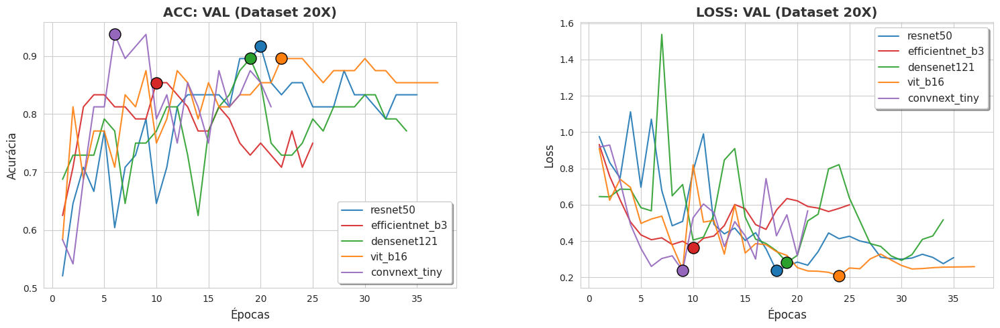

In [13]:

def plot_line_chart_comparison(histories, title_suffix=""):
    sns.set_style("whitegrid") 
    colors = ['#1f77b4', '#d62728', '#2ca02c', '#ff7f0e', '#9467bd']
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    

    ax1 = axes[0]
    for i, (name, hist) in enumerate(histories.items()):
        val_acc = hist['val_acc']
        epochs = range(1, len(val_acc) + 1)

        ax1.plot(
            epochs,
            val_acc,
            label=name,
            color=colors[i % len(colors)],
            linewidth=1.5,
            linestyle='-',
            alpha=0.9
        )

        best_val = max(val_acc)
        best_epoch = val_acc.index(best_val) + 1

        ax1.scatter(
            best_epoch,
            best_val,
            s=150,
            c=colors[i],
            edgecolors='k',
            zorder=10
        )

    ax1.set_title(f'ACC: VAL {title_suffix}', fontsize=14, fontweight='bold', color='#333333')
    ax1.set_xlabel('Épocas', fontsize=12)
    ax1.set_ylabel('Acurácia', fontsize=12)
    ax1.legend(fontsize=11, frameon=True, fancybox=True, shadow=True)

    ax2 = axes[1]
    for i, (name, hist) in enumerate(histories.items()):
        val_loss = hist['val_loss']
        epochs = range(1, len(val_loss) + 1)

        ax2.plot(
            epochs,
            val_loss,
            label=name,
            color=colors[i % len(colors)],
            linewidth=1.5,
            linestyle='-',
            alpha=0.9
        )

        min_loss = min(val_loss)
        best_epoch_loss = val_loss.index(min_loss) + 1

        ax2.scatter(
            best_epoch_loss,
            min_loss,
            s=150,
            c=colors[i],
            edgecolors='k',
            zorder=10
        )

    ax2.set_title(f'LOSS: VAL {title_suffix}', fontsize=14, fontweight='bold', color='#333333')
    ax2.set_xlabel('Épocas', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend(fontsize=11, frameon=True, fancybox=True, shadow=True)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.3)
    plt.show()


print(f"GRÁFICO DE COMPARAÇÃO DO DATASET 20X")
plot_line_chart_comparison(histories_20x, title_suffix="(Dataset 20X)")

In [14]:
import os
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    accuracy_score,
    cohen_kappa_score,
    roc_auc_score,
    classification_report,
    confusion_matrix
)

def evaluate_model_full(
    model,
    loader,
    model_name,
    dataset_name,
    class_names=['ACA', 'SCC', 'NOR'],
    save_dir="results_Rand"
):

    model.eval()

    y_true = []
    y_pred = []
    y_probs = []

    print(f"\nRELATÓRIO: {model_name.upper()} ({dataset_name})")

    with torch.no_grad():

        for inputs, labels in loader:

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)

            outputs = torch.nan_to_num(
                outputs,
                nan=0.0,
                posinf=10.0,
                neginf=-10.0
            )

            _, preds = torch.max(outputs, 1)

            probs = F.softmax(outputs, dim=1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())
            y_probs.extend(probs.cpu().numpy())

    y_probs = np.array(y_probs)

    y_probs = np.nan_to_num(
        y_probs,
        nan=1.0 / len(class_names)
    )

    acc = accuracy_score(y_true, y_pred)

    kappa = cohen_kappa_score(
        y_true,
        y_pred
    )

    try:

        labels_index = list(range(len(class_names)))

        roc_auc = roc_auc_score(
            y_true,
            y_probs,
            multi_class='ovr',
            average='macro',
            labels=labels_index
        )

    except Exception as e:

        print(f"ERRO ROC-AUC: {e}")

        print(
            f"(Shape y_probs: {y_probs.shape} | "
            f"Classes únicas em y_true: {np.unique(y_true)})"
        )

        roc_auc = 0.0

    print(
        f"➤ RESULTADO: "
        f"Accuracy: {acc:.4f} | "
        f"ROC-AUC: {roc_auc:.4f} | "
        f"Kappa: {kappa:.4f}\n"
    )

    print("RELATÓRIO DE CLASSIFICAÇÃO:")

    print(
        classification_report(
            y_true,
            y_pred,
            target_names=class_names,
            digits=4,
            zero_division=0
        )
    )

    cm = confusion_matrix(y_true, y_pred)

    print("\nMATRIZ DE CONFUSÃO:")
    print(cm)

    os.makedirs(save_dir, exist_ok=True)

    plt.figure(figsize=(6, 5))

    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )

    plt.xlabel("Predito")
    plt.ylabel("Real")

    plt.title(f"Matriz de Confusão - {model_name} ({dataset_name})")

    plt.tight_layout()

    plt.savefig(
        f"{save_dir}/cm_{model_name}_{dataset_name}.png",
        dpi=300
    )

    plt.close()

    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(6, 5))

    sns.heatmap(
        cm_norm,
        annot=True,
        fmt='.2f',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )

    plt.xlabel("Predito")
    plt.ylabel("Real")

    plt.title(f"Matriz Normalizada - {model_name} ({dataset_name})")

    plt.tight_layout()

    plt.savefig(
        f"{save_dir}/cm_norm_{model_name}_{dataset_name}.png",
        dpi=300
    )

    plt.close()

    print(f"✔ Matrizes salvas em: {save_dir}/")

    print("-" * 85)

    return acc, roc_auc, kappa, cm

In [15]:
print("RESULTADOS DA AVALIAÇÃO (DATASET 20X)")

for name, model in trained_models_20x.items():

    evaluate_model_full(
        model=model,
        loader=test_loader_20x,
        model_name=name,
        dataset_name="20x"
    )

RESULTADOS DA AVALIAÇÃO (DATASET 20X)

RELATÓRIO: RESNET50 (20x)
➤ RESULTADO: Accuracy: 0.8958 | ROC-AUC: 0.9572 | Kappa: 0.8405

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.8824    0.8333    0.8571        18
         SCC     0.9167    1.0000    0.9565        11
         NOR     0.8947    0.8947    0.8947        19

    accuracy                         0.8958        48
   macro avg     0.8979    0.9094    0.9028        48
weighted avg     0.8951    0.8958    0.8948        48


MATRIZ DE CONFUSÃO:
[[15  1  2]
 [ 0 11  0]
 [ 2  0 17]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: EFFICIENTNET_B3 (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.8958 | ROC-AUC: 0.9835 | Kappa: 0.8428

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     1.0000    0.8333    0.9091        18
         SCC     0.7333    1.0000    0.8462        11
         NOR     0.9444    0.8947    0.9189        19

    accuracy                         0.8958        48
   macro avg     0.8926    0.9094    0.8914        48
weighted avg     0.9169    0.8958    0.8986        48


MATRIZ DE CONFUSÃO:
[[15  2  1]
 [ 0 11  0]
 [ 0  2 17]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: DENSENET121 (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.8542 | ROC-AUC: 0.9945 | Kappa: 0.7815

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.8889    0.8889    0.8889        18
         SCC     0.6875    1.0000    0.8148        11
         NOR     1.0000    0.7368    0.8485        19

    accuracy                         0.8542        48
   macro avg     0.8588    0.8752    0.8507        48
weighted avg     0.8867    0.8542    0.8559        48


MATRIZ DE CONFUSÃO:
[[16  2  0]
 [ 0 11  0]
 [ 2  3 14]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: VIT_B16 (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.8125 | ROC-AUC: 0.9347 | Kappa: 0.7198

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.9286    0.7222    0.8125        18
         SCC     0.6471    1.0000    0.7857        11
         NOR     0.8824    0.7895    0.8333        19

    accuracy                         0.8125        48
   macro avg     0.8193    0.8372    0.8105        48
weighted avg     0.8458    0.8125    0.8146        48


MATRIZ DE CONFUSÃO:
[[13  3  2]
 [ 0 11  0]
 [ 1  3 15]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: CONVNEXT_TINY (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.9583 | ROC-AUC: 0.9957 | Kappa: 0.9359

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.9444    0.9444    0.9444        18
         SCC     0.9091    0.9091    0.9091        11
         NOR     1.0000    1.0000    1.0000        19

    accuracy                         0.9583        48
   macro avg     0.9512    0.9512    0.9512        48
weighted avg     0.9583    0.9583    0.9583        48


MATRIZ DE CONFUSÃO:
[[17  1  0]
 [ 1 10  0]
 [ 0  0 19]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------


In [16]:
#recaregar modelos
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_names = ['resnet50', 'efficientnet_b3', 'densenet121', 'vit_b16', 'convnext_tiny' ]
trained_models_20x = {}

print("="*60)
print("CARREGANDO MODELOS 20X")
print("="*60)

for name in model_names:

    print(f"\nCarregando {name.upper()}...")

    model = get_model(
        model_name=name,
        num_classes=3,
        feature_extract=False
    )

    path = f"Best_models_Rand/best_Rand_{name}_20x.pth"

    model.load_state_dict(
        torch.load(path, map_location=device)
    )

    model.to(device)
    model.eval()

    trained_models_20x[name] = model

    print(f"{name.upper()} carregado com sucesso!")

print("\n" + "="*60)
print("TODOS OS MODELOS 20X FORAM CARREGADOS!")
print("="*60)




print("\nRESULTADOS DA AVALIAÇÃO (DATASET 20X)")

for name, model in trained_models_20x.items():

    evaluate_model_full(
        model=model,
        loader=test_loader_20x,
        model_name=name,
        dataset_name="20x"
    )

#######################################################################################################################


CARREGANDO MODELOS 20X

Carregando RESNET50...
RESNET50 carregado com sucesso!

Carregando EFFICIENTNET_B3...
EFFICIENTNET_B3 carregado com sucesso!

Carregando DENSENET121...
DENSENET121 carregado com sucesso!

Carregando VIT_B16...
VIT_B16 carregado com sucesso!

Carregando CONVNEXT_TINY...
CONVNEXT_TINY carregado com sucesso!

TODOS OS MODELOS 20X FORAM CARREGADOS!

RESULTADOS DA AVALIAÇÃO (DATASET 20X)

RELATÓRIO: RESNET50 (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.8958 | ROC-AUC: 0.9572 | Kappa: 0.8405

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.8824    0.8333    0.8571        18
         SCC     0.9167    1.0000    0.9565        11
         NOR     0.8947    0.8947    0.8947        19

    accuracy                         0.8958        48
   macro avg     0.8979    0.9094    0.9028        48
weighted avg     0.8951    0.8958    0.8948        48


MATRIZ DE CONFUSÃO:
[[15  1  2]
 [ 0 11  0]
 [ 2  0 17]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: EFFICIENTNET_B3 (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.8958 | ROC-AUC: 0.9835 | Kappa: 0.8428

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     1.0000    0.8333    0.9091        18
         SCC     0.7333    1.0000    0.8462        11
         NOR     0.9444    0.8947    0.9189        19

    accuracy                         0.8958        48
   macro avg     0.8926    0.9094    0.8914        48
weighted avg     0.9169    0.8958    0.8986        48


MATRIZ DE CONFUSÃO:
[[15  2  1]
 [ 0 11  0]
 [ 0  2 17]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: DENSENET121 (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.8542 | ROC-AUC: 0.9945 | Kappa: 0.7815

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.8889    0.8889    0.8889        18
         SCC     0.6875    1.0000    0.8148        11
         NOR     1.0000    0.7368    0.8485        19

    accuracy                         0.8542        48
   macro avg     0.8588    0.8752    0.8507        48
weighted avg     0.8867    0.8542    0.8559        48


MATRIZ DE CONFUSÃO:
[[16  2  0]
 [ 0 11  0]
 [ 2  3 14]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: VIT_B16 (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.8125 | ROC-AUC: 0.9347 | Kappa: 0.7198

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.9286    0.7222    0.8125        18
         SCC     0.6471    1.0000    0.7857        11
         NOR     0.8824    0.7895    0.8333        19

    accuracy                         0.8125        48
   macro avg     0.8193    0.8372    0.8105        48
weighted avg     0.8458    0.8125    0.8146        48


MATRIZ DE CONFUSÃO:
[[13  3  2]
 [ 0 11  0]
 [ 1  3 15]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------

RELATÓRIO: CONVNEXT_TINY (20x)


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


➤ RESULTADO: Accuracy: 0.9583 | ROC-AUC: 0.9957 | Kappa: 0.9359

RELATÓRIO DE CLASSIFICAÇÃO:
              precision    recall  f1-score   support

         ACA     0.9444    0.9444    0.9444        18
         SCC     0.9091    0.9091    0.9091        11
         NOR     1.0000    1.0000    1.0000        19

    accuracy                         0.9583        48
   macro avg     0.9512    0.9512    0.9512        48
weighted avg     0.9583    0.9583    0.9583        48


MATRIZ DE CONFUSÃO:
[[17  1  0]
 [ 1 10  0]
 [ 0  0 19]]
✔ Matrizes salvas em: results_Rand/
-------------------------------------------------------------------------------------


In [17]:
IMG_SIZE = 2.8


def get_target_layer(model, model_name):

    name_lower = model_name.lower()

    if 'resnet' in name_lower:
        return [model.layer4[-1]], None

    elif 'efficientnet' in name_lower:
        return [model.features[-1]], None

    elif 'densenet' in name_lower:
        return [model.features[-1]], None

    elif 'vgg' in name_lower:
        return [model.features[-1]], None

    elif 'convnext' in name_lower:
        return [model.features[-1]], None

    elif 'vit' in name_lower:

        def reshape_transform(tensor):

            tensor = tensor[:, 1:, :]

            height = width = int(tensor.size(1) ** 0.5)

            result = tensor.reshape(
                tensor.size(0),
                height,
                width,
                tensor.size(2)
            )

            result = result.transpose(2, 3).transpose(1, 2)

            return result

        return [model.encoder.layers[-1].ln_1], reshape_transform

    else:
        raise ValueError(f"Modelo não suportado: {model_name}")


def denormalize_image(tensor):

    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = tensor.permute(1, 2, 0).cpu().numpy()

    img = (img * std) + mean

    img = np.clip(img, 0, 1)

    return img.astype(np.float32)


def visualize_3_classes_correct(
    model,
    model_name,
    loader,
    device
):

    class_names = {
        0: "ACA",
        1: "SCC",
        2: "NOR"
    }

    needed_classes = [0, 1, 2]

    model.eval()

    target_layers, reshape_transform = get_target_layer(
        model,
        model_name
    )

    cam = GradCAM(
        model=model,
        target_layers=target_layers,
        reshape_transform=reshape_transform
    )

    found_images = {}

    print("=" * 80)
    print(f"GRAD-CAM → {model_name.upper()}")
    print("=" * 80)

    with torch.no_grad():

        for inputs, labels in loader:

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)

            preds = torch.argmax(outputs, dim=1)

            for i in range(len(labels)):

                true_label = labels[i].item()
                pred_label = preds[i].item()

                if true_label == pred_label:

                    if true_label not in found_images:

                        found_images[true_label] = {
                            "image": inputs[i].detach().cpu(),
                            "true": true_label,
                            "pred": pred_label
                        }

            if len(found_images) == len(needed_classes):
                break

    print("\nClasses encontradas:\n")

    for cls in sorted(found_images.keys()):
        print(f"✓ {class_names[cls]}")

    if len(found_images) < len(needed_classes):

        print("\n⚠ Algumas classes não foram encontradas.")
        print("- a classe pode não existir no loader")
        print("- ou não houve predição correta")

    ordered_selection = []

    for cls in needed_classes:

        if cls in found_images:
            ordered_selection.append(found_images[cls])

    original_images = []
    heatmap_images = []

    titles_original = []
    titles_heatmap = []

    for sample in ordered_selection:

        img_tensor = sample["image"]
        label_idx = sample["true"]
        pred_idx  = sample["pred"]

        input_tensor = img_tensor.unsqueeze(0).to(device)

        targets = [ClassifierOutputTarget(pred_idx)]

        grayscale_cam = cam(
            input_tensor=input_tensor,
            targets=targets
        )[0]

        rgb_img = denormalize_image(img_tensor)

        visualization = show_cam_on_image(
            rgb_img,
            grayscale_cam,
            use_rgb=True,
            image_weight=0.7
        )

        original_images.append(rgb_img)
        heatmap_images.append(visualization)

        titles_original.append(
            f"TRUE: {class_names[label_idx]}"
        )

        titles_heatmap.append(
            f"PRED: {class_names[pred_idx]}"
        )

    num_cols = len(ordered_selection)

    fig, axes = plt.subplots(
        2,
        num_cols,
        figsize=(num_cols * IMG_SIZE, 2 * IMG_SIZE)
    )

    if num_cols == 1:
        axes = axes.reshape(2, 1)

    for i in range(num_cols):

        axes[0, i].imshow(original_images[i])

        axes[0, i].set_title(
            titles_original[i],
            fontsize=12,
            fontweight='bold'
        )

        axes[0, i].axis("off")

    for i in range(num_cols):

        axes[1, i].imshow(heatmap_images[i])

        axes[1, i].set_title(
            titles_heatmap[i],
            fontsize=12,
            fontweight='bold',
            color='green'
        )

        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()
    plt.close()


best_models_20x = [
    'resnet50',
    'efficientnet_b3',
    'densenet121',
    'vit_b16',
    'convnext_tiny'
]


GRAD-CAM → DATASET 20X

----------------------------------------------------------------------
MODELO → RESNET50
----------------------------------------------------------------------
GRAD-CAM → RESNET50


/home/joyzinhw/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)



Classes encontradas:

✓ ACA
✓ SCC
✓ NOR


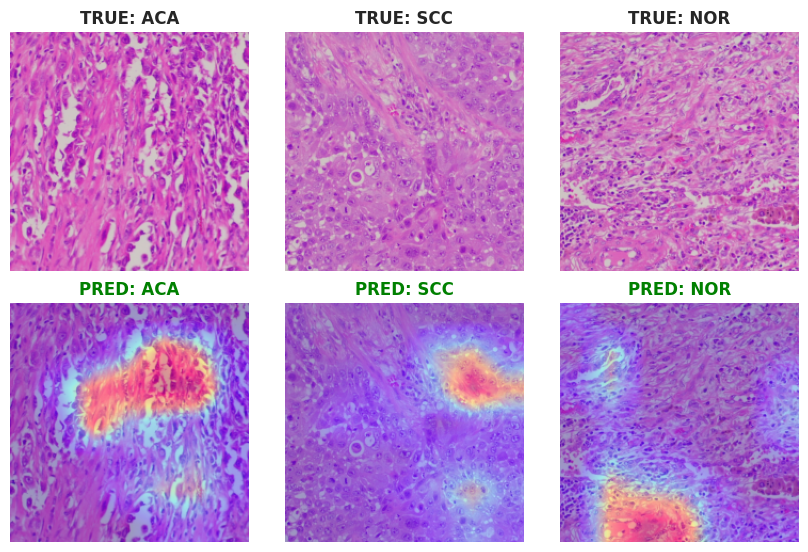


----------------------------------------------------------------------
MODELO → EFFICIENTNET_B3
----------------------------------------------------------------------
GRAD-CAM → EFFICIENTNET_B3

Classes encontradas:

✓ ACA
✓ SCC
✓ NOR


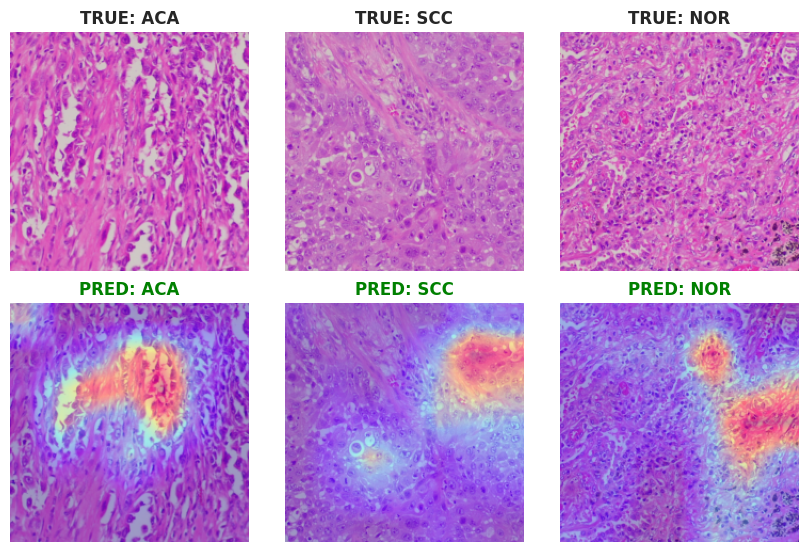


----------------------------------------------------------------------
MODELO → DENSENET121
----------------------------------------------------------------------
GRAD-CAM → DENSENET121

Classes encontradas:

✓ ACA
✓ SCC
✓ NOR


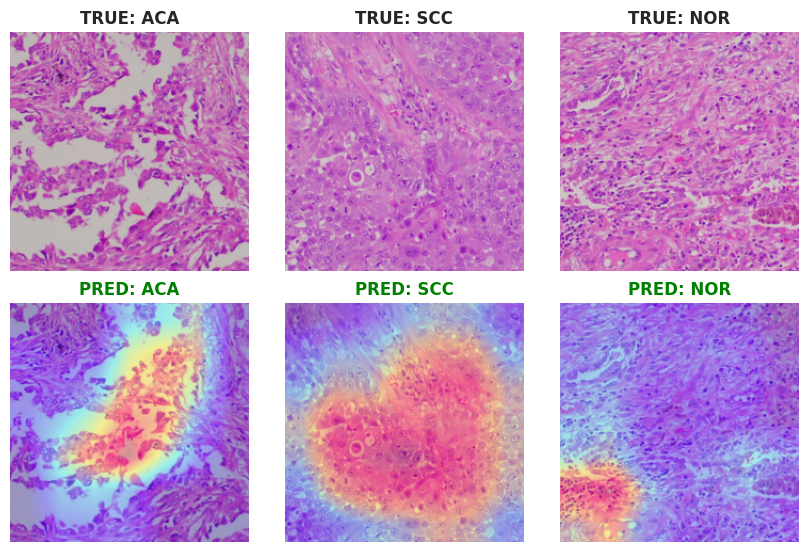


----------------------------------------------------------------------
MODELO → VIT_B16
----------------------------------------------------------------------
GRAD-CAM → VIT_B16

Classes encontradas:

✓ ACA
✓ SCC
✓ NOR


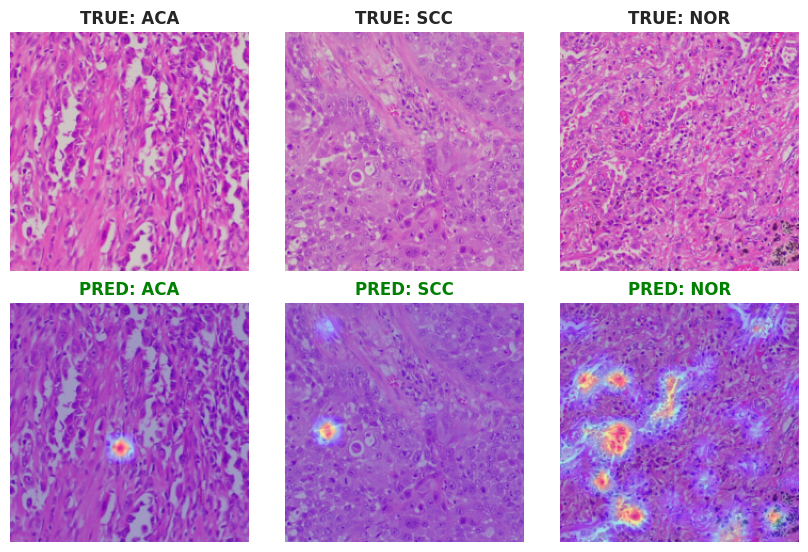


----------------------------------------------------------------------
MODELO → CONVNEXT_TINY
----------------------------------------------------------------------
GRAD-CAM → CONVNEXT_TINY

Classes encontradas:

✓ ACA
✓ SCC
✓ NOR


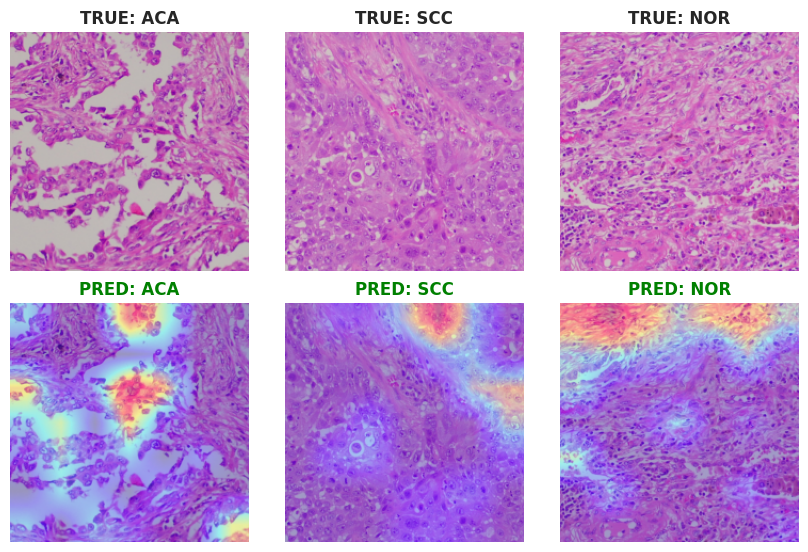

In [18]:
print("\n" + "=" * 80)
print("GRAD-CAM → DATASET 20X")
print("=" * 80)

for model_name in best_models_20x:

    print("\n" + "-" * 70)
    print(f"MODELO → {model_name.upper()}")
    print("-" * 70)

    model = trained_models_20x[model_name]

    visualize_3_classes_correct(
        model=model,
        model_name=model_name,
        loader=test_loader_20x,
        device=device
    )

    torch.cuda.empty_cache()

In [19]:
IMG_SIZE = 3


def get_target_layer(model, model_name):

    name_lower = model_name.lower()

    if 'resnet' in name_lower:
        return [model.layer4[-1]], None

    elif 'efficientnet' in name_lower:
        return [model.features[-1]], None

    elif 'densenet' in name_lower:
        return [model.features[-1]], None

    elif 'vgg' in name_lower:
        return [model.features[-1]], None

    elif 'convnext' in name_lower:
        return [model.features[-1]], None

    elif 'vit' in name_lower:

        def reshape_transform(tensor):

            tensor = tensor[:, 1:, :]

            height = width = int(tensor.size(1) ** 0.5)

            result = tensor.reshape(
                tensor.size(0),
                height,
                width,
                tensor.size(2)
            )

            result = result.transpose(2, 3).transpose(1, 2)

            return result

        return [model.encoder.layers[-1].ln_1], reshape_transform

    else:
        raise ValueError(
            f"Modelo não suportado: {model_name}"
        )


def denormalize_image(tensor):

    mean = np.array([0.485, 0.456, 0.406])

    std = np.array([0.229, 0.224, 0.225])

    img = tensor.permute(1, 2, 0).cpu().numpy()

    img = (img * std) + mean

    img = np.clip(img, 0, 1)

    return img.astype(np.float32)


def visualize_errors_top_bottom(
    model,
    model_name,
    loader,
    device
):

    class_names = {
        0: "ACA",
        1: "SCC",
        2: "NOR"
    }

    model.eval()

    target_layers, reshape_transform = get_target_layer(
        model,
        model_name
    )

    cam = GradCAM(
        model=model,
        target_layers=target_layers,
        reshape_transform=reshape_transform
    )

    wrong_predictions = []

    print("=" * 70)
    print(f"ERROR ANALYSIS → {model_name.upper()}")
    print("=" * 70)

    with torch.no_grad():

        for inputs, labels in loader:

            inputs = inputs.to(device)

            labels = labels.to(device)

            outputs = model(inputs)

            preds = torch.argmax(
                outputs,
                dim=1
            )

            for i in range(len(labels)):

                true_label = labels[i].item()

                pred_label = preds[i].item()

                if true_label != pred_label:

                    wrong_predictions.append(
                        (
                            inputs[i].detach().cpu(),
                            true_label,
                            pred_label
                        )
                    )

    total_errors = len(wrong_predictions)

    if total_errors == 0:

        print("\n✓ Nenhuma predição incorreta encontrada.")

        return

    print(f"\n➤ Total de erros encontrados: {total_errors}")

    images_per_row = 6

    num_blocks = math.ceil(
        total_errors / images_per_row
    )

    total_plot_rows = num_blocks * 2

    fig, axes = plt.subplots(
        total_plot_rows,
        images_per_row,
        figsize=(
            images_per_row * IMG_SIZE,
            total_plot_rows * IMG_SIZE
        )
    )

    if total_plot_rows == 1:
        axes = axes.reshape(1, -1)

    if images_per_row == 1:
        axes = axes.reshape(-1, 1)

    if len(axes.shape) == 1:
        axes = axes.reshape(
            -1,
            images_per_row
        )

    for ax in axes.flatten():
        ax.axis("off")

    for i, (
        img_tensor,
        label_idx,
        pred_idx
    ) in enumerate(wrong_predictions):

        block_idx = i // images_per_row

        col_idx = i % images_per_row

        row_original = block_idx * 2

        row_heatmap = block_idx * 2 + 1

        input_tensor = img_tensor.unsqueeze(0).to(device)

        targets = [
            ClassifierOutputTarget(pred_idx)
        ]

        grayscale_cam = cam(
            input_tensor=input_tensor,
            targets=targets
        )[0]

        rgb_img = denormalize_image(
            img_tensor
        )

        visualization = show_cam_on_image(
            rgb_img,
            grayscale_cam,
            use_rgb=True,
            image_weight=0.7
        )

        true_class = class_names[label_idx]

        pred_class = class_names[pred_idx]

        axes[row_original, col_idx].imshow(
            rgb_img
        )

        axes[row_original, col_idx].set_title(
            f"TRUE: {true_class}",
            fontsize=12,
            fontweight='bold',
            color='black'
        )

        axes[row_original, col_idx].axis("off")

        axes[row_heatmap, col_idx].imshow(
            visualization
        )

        axes[row_heatmap, col_idx].set_title(
            f"PRED: {pred_class}",
            fontsize=12,
            fontweight='bold',
            color='red'
        )

        axes[row_heatmap, col_idx].axis("off")

    plt.tight_layout()

    plt.subplots_adjust(
        wspace=0.1,
        hspace=0.3
    )

    plt.show()

    plt.close()


best_models_20x = [
    'resnet50',
    'efficientnet_b3',
    'densenet121',
    'vit_b16',
    'convnext_tiny'
]


ERROR ANALYSIS REPORT → DATASET 20X

--------------------------------------------------------------------------------
MODEL → RESNET50
--------------------------------------------------------------------------------
ERROR ANALYSIS → RESNET50

➤ Total de erros encontrados: 5


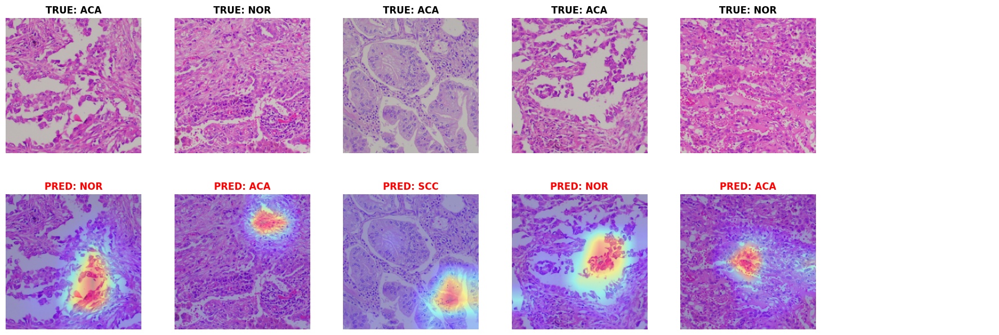


--------------------------------------------------------------------------------
MODEL → EFFICIENTNET_B3
--------------------------------------------------------------------------------
ERROR ANALYSIS → EFFICIENTNET_B3

➤ Total de erros encontrados: 5


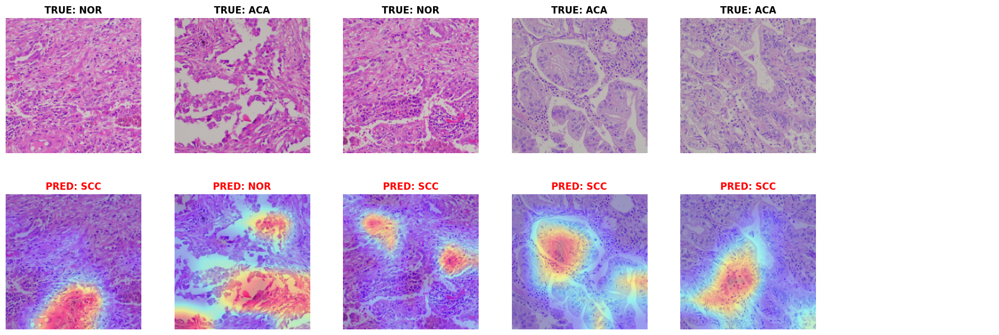


--------------------------------------------------------------------------------
MODEL → DENSENET121
--------------------------------------------------------------------------------
ERROR ANALYSIS → DENSENET121

➤ Total de erros encontrados: 7


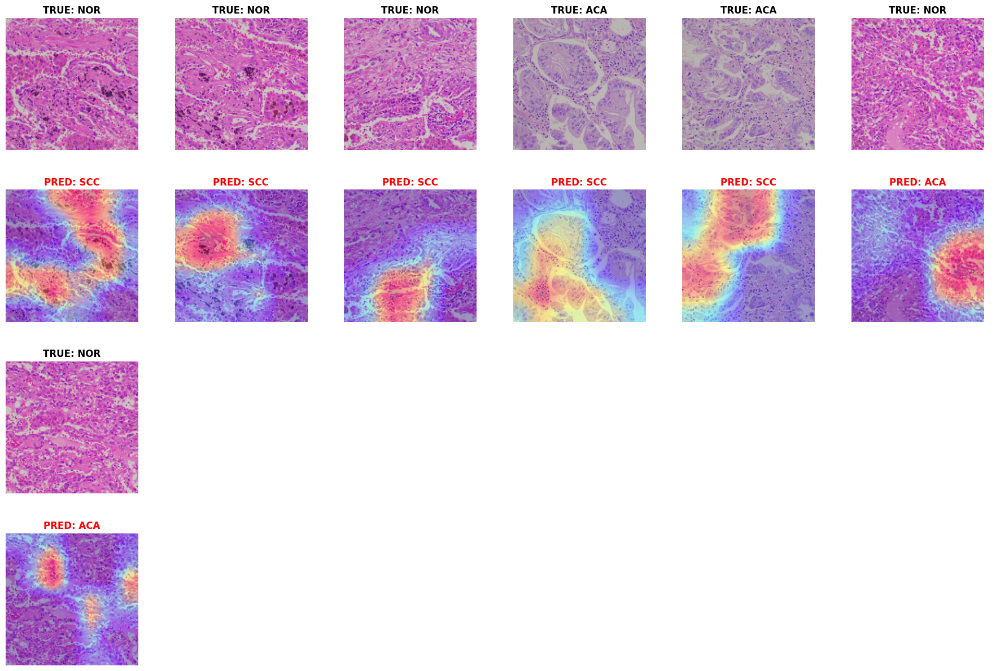


--------------------------------------------------------------------------------
MODEL → VIT_B16
--------------------------------------------------------------------------------
ERROR ANALYSIS → VIT_B16

➤ Total de erros encontrados: 9


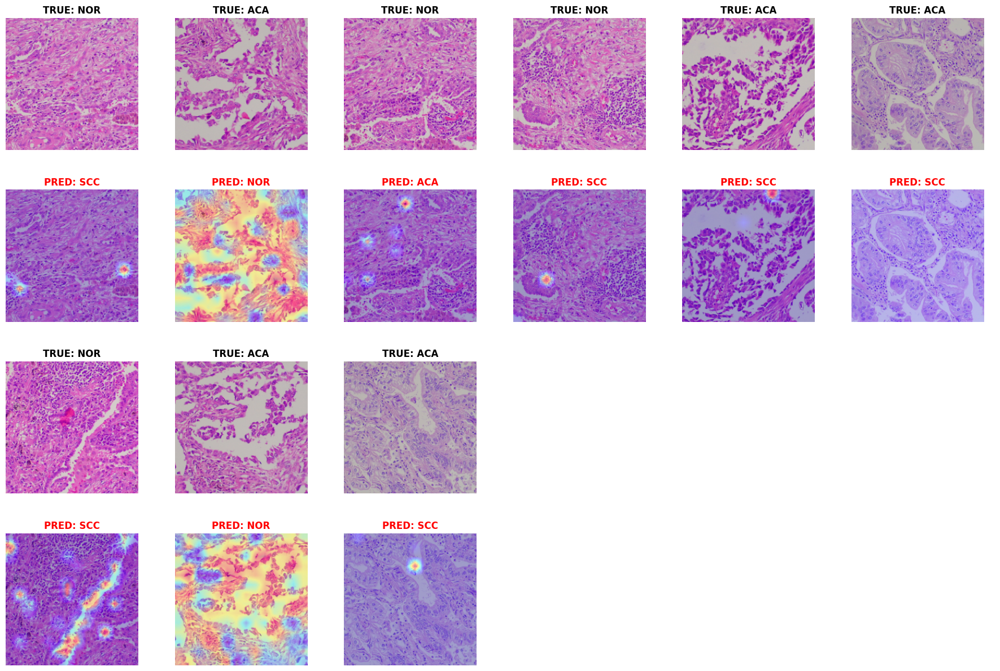


--------------------------------------------------------------------------------
MODEL → CONVNEXT_TINY
--------------------------------------------------------------------------------
ERROR ANALYSIS → CONVNEXT_TINY

➤ Total de erros encontrados: 2


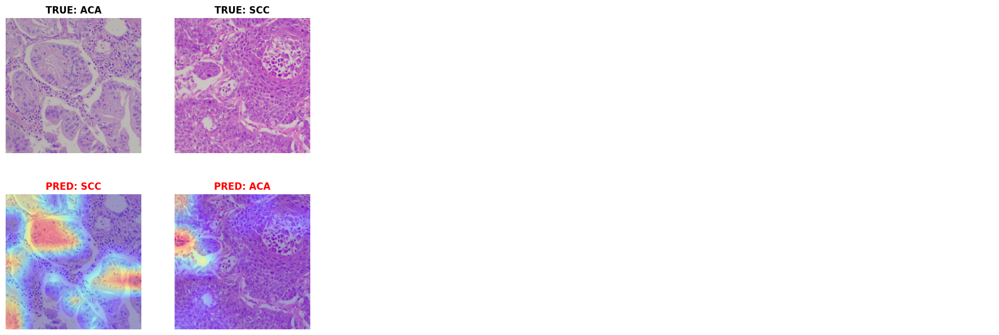

In [20]:
print("\n" + "=" * 100)
print("ERROR ANALYSIS REPORT → DATASET 20X")
print("=" * 100)

for model_name in best_models_20x:

    print("\n" + "-" * 80)
    print(f"MODEL → {model_name.upper()}")
    print("-" * 80)

    visualize_errors_top_bottom(
        model=trained_models_20x[model_name],
        model_name=model_name,
        loader=test_loader_20x,
        device=device
    )